In [1]:
import pandas as pd # Proporciona estructuras de datos y herramientas para el análisis eficiente de datos tabulares, series temporales y matrices etiquetadas o no etiquetadas.
import plotly.express as px # Permite crear diversas figuras a la vez.
import seaborn as sns
import matplotlib.pyplot as plt # Está diseñada para crear gráficos y visualizaciones interactivas de datos, por ejemplo, para trazar las curvas de aprendizaje y evaluar el proceso de entrenamiento.
import numpy as np # Se utiliza para crear arreglos multidimensionales y realizar operaciones matemáticas, lógicas y de álgebra lineal, además de la generación de números aleatorios.
import tensorflow as tf #  Librería desarrollada por Google, es de las más utilizadas para diseñar, entrenar, validar y probar el desarrollo de una red neuronal.
from sklearn.model_selection import train_test_split # Esta biblioteca proporciona el método train_test_split para dividir el conjunto de datos inicial en los conjuntos de entrenamiento y validación.
from sklearn.preprocessing import StandardScaler # Estándariza las características eliminando la media y escalando a una varianza unitaria. (z = (x - u) / s)
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay # Se utiliza para gráficar en una matriz una comparación entre los valores reales y predichos
from sklearn.decomposition import PCA

In [2]:
data = pd.read_csv('fetal_health.csv')
df = data

df.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [3]:
df.tail()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
2121,140.0,0.000,0.000,0.007,0.0,0.0,0.0,79.0,0.2,25.0,...,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0,2.0
2122,140.0,0.001,0.000,0.007,0.0,0.0,0.0,78.0,0.4,22.0,...,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2.0
2123,140.0,0.001,0.000,0.007,0.0,0.0,0.0,79.0,0.4,20.0,...,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2.0
2124,140.0,0.001,0.000,0.006,0.0,0.0,0.0,78.0,0.4,27.0,...,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2.0
2125,142.0,0.002,0.002,0.008,0.0,0.0,0.0,74.0,0.4,36.0,...,117.0,159.0,2.0,1.0,145.0,143.0,145.0,1.0,0.0,1.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [5]:
df.duplicated().sum()

13

In [6]:
duplicated_rows = df[df.duplicated()]
print(duplicated_rows)


      baseline value  accelerations  fetal_movement  uterine_contractions  \
68             140.0          0.007           0.000                 0.004   
234            123.0          0.000           0.000                 0.000   
306            145.0          0.000           0.020                 0.000   
324            135.0          0.000           0.000                 0.000   
333            144.0          0.000           0.019                 0.000   
787            123.0          0.003           0.003                 0.000   
791            123.0          0.003           0.004                 0.000   
798            146.0          0.000           0.000                 0.003   
849            138.0          0.002           0.000                 0.004   
1113           122.0          0.000           0.000                 0.000   
1114           122.0          0.000           0.000                 0.000   
1115           122.0          0.000           0.000                 0.000   

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
baseline value,2126.0,133.303857,9.840844,106.0,126.000,133.000,140.000,160.000
accelerations,2126.0,0.003178,0.003866,0.0,0.000,0.002,0.006,0.019
fetal_movement,2126.0,0.009481,0.046666,0.0,0.000,0.000,0.003,0.481
uterine_contractions,2126.0,0.004366,0.002946,0.0,0.002,0.004,0.007,0.015
light_decelerations,2126.0,0.001889,0.002960,0.0,0.000,0.000,0.003,0.015
severe_decelerations,2126.0,0.000003,0.000057,0.0,0.000,0.000,0.000,0.001
prolongued_decelerations,2126.0,0.000159,0.000590,0.0,0.000,0.000,0.000,0.005
abnormal_short_term_variability,2126.0,46.990122,17.192814,12.0,32.000,49.000,61.000,87.000
mean_value_of_short_term_variability,2126.0,1.332785,0.883241,0.2,0.700,1.200,1.700,7.000
percentage_of_time_with_abnormal_long_term_variability,2126.0,9.846660,18.396880,0.0,0.000,0.000,11.000,91.000


In [8]:
# Scatter plot matrix
features = df.drop(["fetal_health"], axis=1).columns # Se elimina la columna Heart Disease.
fig = px.scatter_matrix(data_frame=df, # Se crea una matriz de gráficos de dispersión con los datos del DataFrame.
                        dimensions=features, # Se especifican las columnas a incluir en el gráfico, sin Heart Disease.
                        color=df['fetal_health']) # Se utiliza la columna 'Occupancy' para colorear los puntos en función de la ocupación.
fig.update_traces(marker = dict(size=4), diagonal_visible=False, showupperhalf=False) # Se actualiza el tamaño de los marcadores, se ocultan las diagonales y se muestra solo la mitad inferior de la matriz.
fig.update_layout(width=900, height=600, title="Fetal Health Classification", font_size=9) # Se ajustan las dimensiones del gráfico, se personaliza el título y el tamaño de la fuente del gráfico.
fig.show() # Se muestra la matriz con los gráficos de dispersión.

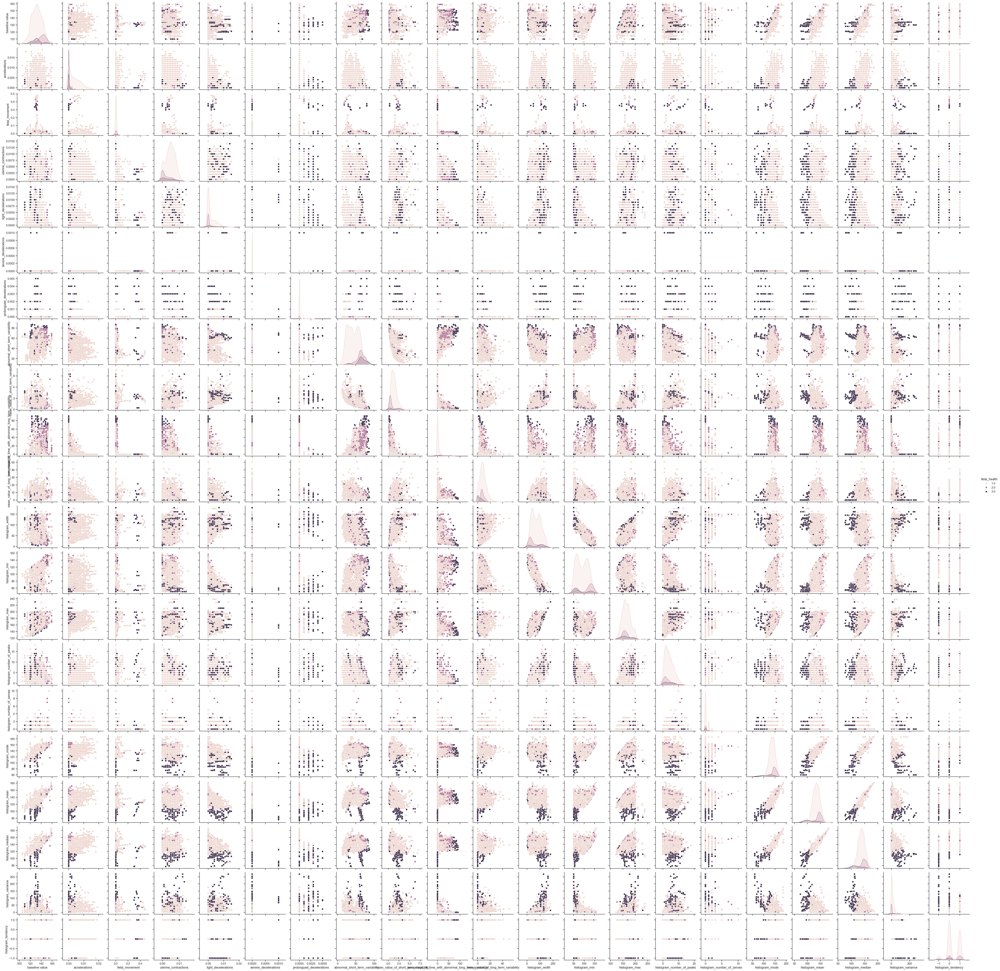

In [9]:
sns.set_theme(style="ticks") # Se estable el estilo del gráfico de pares.
sns.pairplot(df, hue="fetal_health"); # Se crea un gráfico de pares para visualizar la relación entre todas las variables del dataframe.

In [10]:
X = df.drop(["fetal_health"], axis=1) 
y = df['fetal_health']  

scaler = StandardScaler()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

y_train = y_train - 1
y_test = y_test - 1

print(X_train)
print(f'\n\n{X_train.shape}')
print('\n-----------------------------\n')
print(f'\n\n{X_test}')
print(X_test.shape)

[[-0.81890715 -0.82497568 -0.20426125 ... -0.74290279 -0.58051372
  -0.51669716]
 [ 0.69242905 -0.82497568 -0.20426125 ...  0.28143057 -0.54596417
  -0.51669716]
 [-1.12117438 -0.82497568 -0.20426125 ... -1.15263613 -0.54596417
  -0.51669716]
 ...
 [-1.12117438  0.46404882 -0.20426125 ... -0.81119168  0.42142321
  -0.51669716]
 [-1.82646461 -0.05156098 -0.20426125 ... -0.60632501  0.9051169
  -0.51669716]
 [ 0.89394054 -0.56717078 -0.20426125 ...  0.7594528  -0.51141462
   1.11902941]]


(1700, 21)

-----------------------------



[[-0.01286117 -0.30936588  0.00273972 ...  0.00827501 -0.33866688
  -0.51669716]
 [-0.81890715 -0.82497568 -0.18356116 ... -0.87948057  0.35232411
   1.11902941]
 [-0.21437267  0.20624392 -0.14216096 ... -0.40145834  0.07592772
  -0.51669716]
 ...
 [ 1.09545203  0.72185372 -0.10076077 ...  0.89603058 -0.30411733
   1.11902941]
 [ 0.28940606 -0.82497568 -0.14216096 ... -0.12830277 -0.58051372
   1.11902941]
 [ 1.09545203 -0.30936588 -0.20426125 ...  1.6472083

In [11]:
# Aplicar PCA, manteniendo el 95% de la varianza
pca = PCA(0.95)

X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

print(X_train_pca)
print(f'\n\n{X_train_pca.shape}')
print('\n-----------------------------\n')
print(f'\n\n{X_test_pca}')
print(X_test_pca.shape)

[[-0.26052796 -1.6685988  -1.78895575 ...  0.25291753  0.56163216
  -0.22359422]
 [ 0.36895021  1.32530972  1.36868962 ...  0.25994166  0.79808066
  -0.18366724]
 [-0.34618622 -2.4535948  -2.23774543 ... -0.0704288   0.13920738
   0.04146825]
 ...
 [-2.68737411  0.07237252 -1.99156365 ...  0.40321386 -0.13177274
   0.07674543]
 [-2.89409114  0.00959551 -0.87800312 ...  0.69454109 -0.3494736
  -0.64333844]
 [ 2.40645771  0.41060484 -0.7839227  ... -0.30434169  0.14266032
  -0.07683688]]


(1700, 14)

-----------------------------



[[ 0.17837607  0.01066151 -0.72543684 ... -0.60305388  0.20352279
  -0.32955253]
 [-1.86330904 -1.37816078  0.499789   ... -0.79325276  0.0523633
   0.02991579]
 [-1.9081188  -0.09705314  1.50617953 ... -0.53522528  0.96253293
   0.71611446]
 ...
 [ 0.33080544  2.87286384 -1.40027361 ...  0.00910708 -0.31404751
   0.3457094 ]
 [ 0.47364491 -0.89344178  0.03914221 ... -0.62534188 -0.11623294
   1.39334678]
 [ 2.89546946  1.4985886   0.32116758 ... -0.63526529

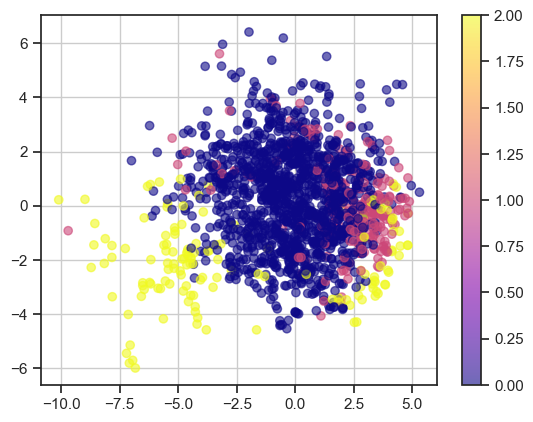

In [12]:
# Graficar las dos primeras componentes principales
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='plasma', alpha=0.6)
# Añadir barra de color para las clases
plt.colorbar()

# Mostrar la cuadrícula
plt.grid(True)

# Mostrar el gráfico
plt.show()